In [1]:
#from sklearn.datasets import make_regression
import numpy as np
import pandas as pd
import ast  # string of dictionary to dictionary (csv row of column to dictionary)
import pickle
from collections import Counter
#%matplotlib notebook
from matplotlib import pyplot as plt
import matplotlib as mpl
import scipy.stats
from numpy import sqrt
%matplotlib inline
# Visualitzarem només 3 decimals per mostra
#pd.set_option('display.float_format', lambda x: '%.3f' % x)

import os
import warnings
import tempfile

import random
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor 
from sklearn.metrics import mean_absolute_error

import time
import numpy as np

from pandas_datareader import data
import matplotlib.pyplot

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

#imbalanced dataset
import tensorflow as tf
from tensorflow import keras

# basic models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import log_loss

# ensemble models
import xgboost as xgb
from xgboost import XGBClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier

from tqdm import tqdm
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


from sklearn.datasets import make_classification

from sklearn.preprocessing import StandardScaler

# feature selection
from sklearn.feature_selection import SelectKBest


# model selection
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
# skopt tuning
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from lightgbm import LGBMClassifier


# metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Funcio per a llegir dades en format csv
def load_dataset(path):
    dataset = pd.read_csv(path, header=0, delimiter=',')
    return dataset

### Data download

In [91]:
data2014 = load_dataset('/Users/carlo/OneDrive/Escritorio/UNI/TERCERO/AP/kaggle/2014_Financial_Data.csv')
data_values = data2014.values
data2014.dataframeName = '2014_Financial_Data.csv'

x = data_values[:, :2]
y = data_values[:, 2]

print("Dimensionalitat de la BBDD:", data2014.shape)
print("Dimensionalitat de les entrades X", x.shape)
print("Dimensionalitat de l'atribut Y", y.shape)

Dimensionalitat de la BBDD: (3808, 225)
Dimensionalitat de les entrades X (3808, 2)
Dimensionalitat de l'atribut Y (3808,)


### EDA + DATA CLEANING

In [96]:
data2014.head(10)

,Unnamed: 0,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,Sector,2015 PRICE VAR [%],Class
0,PG,7.440100e+10,-0.0713,3.903000e+10,3.537100e+10,0.000000e+00,2.146100e+10,2.146100e+10,1.391000e+10,7.090000e+08,...,-0.0187,-0.0217,0.0359,0.0316,0.1228,0.0000,-0.1746,Consumer Defensive,-9.323276,0
1,VIPS,3.734148e+09,1.1737,2.805625e+09,9.285226e+08,1.083303e+08,3.441414e+08,7.939267e+08,1.345959e+08,1.214869e+07,...,NaN,NaN,NaN,NaN,NaN,1.6484,1.7313,Consumer Defensive,-25.512193,0
2,KR,9.837500e+10,0.0182,7.813800e+10,2.023700e+10,0.000000e+00,1.519600e+10,1.751200e+10,2.725000e+09,4.430000e+08,...,0.0618,0.0981,0.1886,0.3268,0.2738,0.0000,0.0234,Consumer Defensive,33.118297,1
3,RAD,2.552641e+10,0.0053,1.820268e+10,7.323734e+09,0.000000e+00,6.561162e+09,6.586482e+09,7.372520e+08,4.245910e+08,...,0.0211,-0.0510,-0.0189,0.1963,-0.0458,0.0000,-0.0060,Consumer Defensive,2.752291,1
4,GIS,1.790960e+10,0.0076,1.153980e+10,6.369800e+09,0.000000e+00,3.474300e+09,3.412400e+09,2.957400e+09,3.024000e+08,...,0.0257,0.0090,0.0215,0.0274,0.1025,0.0000,-0.0220,Consumer Defensive,12.897715,1
5,PM,8.010600e+10,0.0010,6.077500e+10,1.933100e+10,0.000000e+00,7.001000e+09,7.629000e+09,1.170200e+10,1.052000e+09,...,0.0392,-0.1274,-0.0781,-0.6769,0.0642,0.0000,0.0161,Consumer Defensive,13.980937,1
6,KO,4.599800e+10,-0.0183,1.788900e+10,2.810900e+10,0.000000e+00,1.721800e+10,1.840100e+10,9.708000e+09,4.830000e+08,...,-0.0835,-0.0540,0.0219,-0.0763,0.1258,0.0000,-0.0053,Consumer Defensive,5.339413,1
7,WMT,4.762940e+11,0.0163,3.580690e+11,1.182250e+11,0.000000e+00,9.135300e+10,9.135300e+10,2.687200e+10,2.335000e+09,...,-0.0134,0.0241,0.0081,0.0309,0.0463,0.0000,0.0307,Consumer Defensive,-26.653702,0
8,MDLZ,3.424400e+10,-0.0299,2.164700e+10,1.259700e+10,0.000000e+00,8.457000e+09,9.355000e+09,3.242000e+09,6.880000e+08,...,-0.1207,-0.0703,-0.0792,-0.1051,-0.0248,0.0000,-0.0256,Consumer Defensive,23.809818,1
9,MO,2.452200e+10,0.0023,1.436200e+10,1.016000e+10,0.000000e+00,2.539000e+09,2.540000e+09,7.620000e+09,8.080000e+08,...,0.0783,0.0857,-0.0110,-0.2593,0.0121,0.0000,0.0850,Consumer Defensive,23.865489,1


In [97]:
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna(axis=1, how='all') # drop columns with NaN7
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=40, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

In [98]:
corr = data2014.corr()
corr

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,...,3Y Dividend per Share Growth (per Share),Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,2015 PRICE VAR [%],Class
Revenue,1.000000,-0.004361,0.975342,0.816958,0.411823,0.596569,0.846862,0.776417,0.710819,0.785332,...,0.061886,-0.006176,-0.018053,-0.005788,-0.000991,-0.012868,-0.005421,-0.017058,-0.003393,-0.016168
Revenue Growth,-0.004361,1.000000,-0.003586,-0.004860,-0.002691,-0.004343,-0.004627,-0.004497,-0.004310,-0.004188,...,-0.002650,0.116797,0.001865,-0.000271,-0.000202,0.001098,-0.000384,0.000377,0.000059,-0.015275
Cost of Revenue,0.975342,-0.003586,1.000000,0.669573,0.364931,0.432869,0.649120,0.582227,0.609620,0.620057,...,0.050158,-0.005086,-0.014992,-0.004755,-0.003525,-0.010391,-0.004494,-0.014103,-0.002735,-0.015652
Gross Profit,0.816958,-0.004860,0.669573,1.000000,0.481038,0.876360,0.976968,0.916121,0.799826,0.876765,...,0.070266,-0.006845,-0.019728,-0.006442,0.004908,-0.014710,-0.005961,-0.018821,-0.004305,-0.014909
R&D Expenses,0.411823,-0.002691,0.364931,0.481038,1.000000,0.296253,0.363520,0.395753,0.260931,0.479079,...,0.031550,-0.002757,-0.009099,-0.003470,0.016818,-0.005468,-0.002168,-0.009449,-0.003395,0.019225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Debt Growth,-0.012868,0.001098,-0.010391,-0.014710,-0.005468,-0.012790,-0.014106,-0.013420,-0.014536,-0.012309,...,0.001438,0.009060,0.125195,0.001998,-0.000818,1.000000,0.001697,0.028943,0.007804,-0.013853
R&D Expense Growth,-0.005421,-0.000384,-0.004494,-0.005961,-0.002168,-0.005281,-0.005624,-0.005631,-0.005407,-0.005235,...,-0.012644,-0.000465,0.011531,-0.000010,0.000245,0.001697,1.000000,0.001226,-0.000463,0.017353
SG&A Expenses Growth,-0.017058,0.000377,-0.014103,-0.018821,-0.009449,-0.016324,-0.017686,-0.017984,-0.016085,-0.016976,...,-0.010211,0.002260,0.045528,0.263681,-0.065517,0.028943,0.001226,1.000000,0.249030,0.002973
2015 PRICE VAR [%],-0.003393,0.000059,-0.002735,-0.004305,-0.003395,-0.004343,-0.004238,-0.004529,-0.003019,-0.005352,...,0.002406,-0.000652,-0.001894,0.001560,-0.000912,0.007804,-0.000463,0.249030,1.000000,0.028272


In [11]:
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set figure size
f, ax = plt.subplots(figsize=(200, 200))

# Drawing the heatmap
plot = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.tight_layout()

C:\Users\carlo\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


In [100]:
data2014

,Unnamed: 0,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,Sector,2015 PRICE VAR [%],Class
0,PG,7.440100e+10,-0.0713,3.903000e+10,3.537100e+10,0.000000e+00,2.146100e+10,2.146100e+10,1.391000e+10,7.090000e+08,...,-0.0187,-0.0217,0.0359,0.0316,0.1228,0.0000,-0.1746,Consumer Defensive,-9.323276,0
1,VIPS,3.734148e+09,1.1737,2.805625e+09,9.285226e+08,1.083303e+08,3.441414e+08,7.939267e+08,1.345959e+08,1.214869e+07,...,NaN,NaN,NaN,NaN,NaN,1.6484,1.7313,Consumer Defensive,-25.512193,0
2,KR,9.837500e+10,0.0182,7.813800e+10,2.023700e+10,0.000000e+00,1.519600e+10,1.751200e+10,2.725000e+09,4.430000e+08,...,0.0618,0.0981,0.1886,0.3268,0.2738,0.0000,0.0234,Consumer Defensive,33.118297,1
3,RAD,2.552641e+10,0.0053,1.820268e+10,7.323734e+09,0.000000e+00,6.561162e+09,6.586482e+09,7.372520e+08,4.245910e+08,...,0.0211,-0.0510,-0.0189,0.1963,-0.0458,0.0000,-0.0060,Consumer Defensive,2.752291,1
4,GIS,1.790960e+10,0.0076,1.153980e+10,6.369800e+09,0.000000e+00,3.474300e+09,3.412400e+09,2.957400e+09,3.024000e+08,...,0.0257,0.0090,0.0215,0.0274,0.1025,0.0000,-0.0220,Consumer Defensive,12.897715,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3803,TSRI,4.952987e+07,0.1028,4.125164e+07,8.278229e+06,0.000000e+00,8.253061e+06,8.253061e+06,2.516800e+04,0.000000e+00,...,-0.0384,0.0000,-0.0041,-0.0049,0.0000,0.0000,0.0213,Technology,29.362884,1
3804,TZOO,1.532400e+08,-0.1019,1.917400e+07,1.340660e+08,1.132600e+07,1.125130e+08,1.162560e+08,1.781000e+07,0.000000e+00,...,0.1529,0.0000,-0.1872,0.1823,0.0000,0.2830,-0.0637,Technology,-31.167763,0
3805,USATP,4.200000e+07,NaN,2.700000e+07,1.500000e+07,NaN,1.400000e+07,1.500000e+07,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Technology,-23.558900,0
3806,WSTG,3.407580e+08,0.1344,3.159480e+08,2.481000e+07,0.000000e+00,1.651300e+07,1.651300e+07,8.297000e+06,-4.720000e+05,...,-0.0333,0.1338,0.0023,0.0890,0.0000,0.0000,0.0650,Technology,7.779579,1


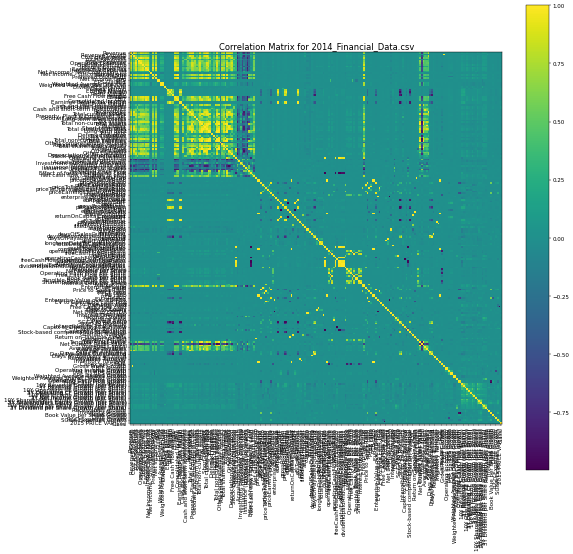

In [12]:
plotCorrelationMatrix(data2014, 15)

In [101]:
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna(axis=1, how='all') # drop columns with NaN7
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

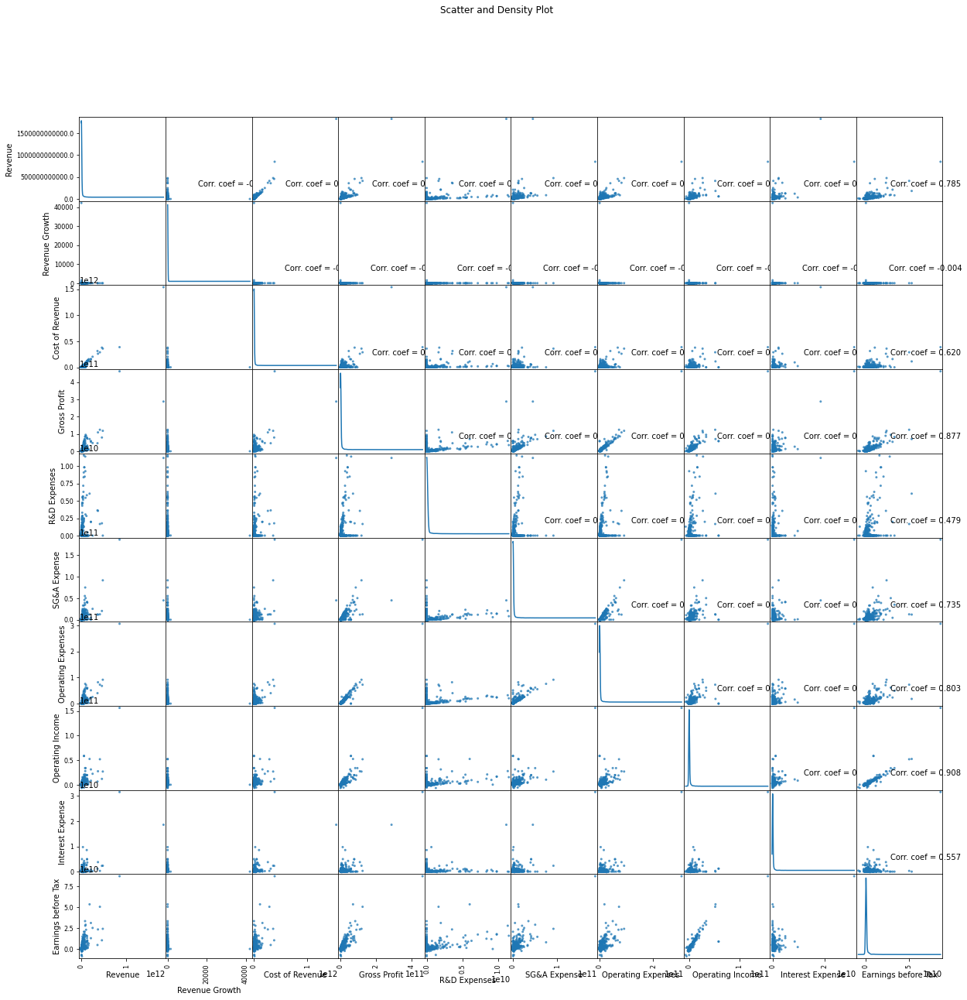

In [213]:
plotScatterMatrix(data2014, 20, 10)

## We start de data cleaning

C:\Users\carlo\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


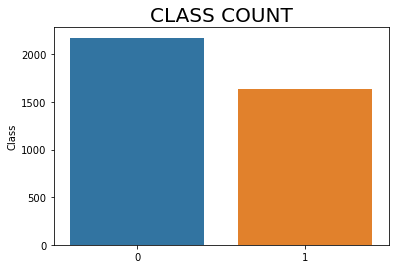

C:\Users\carlo\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


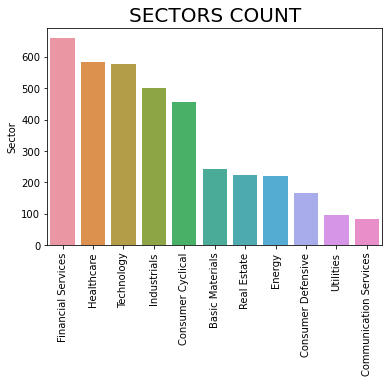

In [102]:
# Plot class distribution
df2014_class = data2014['Class'].value_counts()
sns.barplot(np.arange(len(df2014_class)), df2014_class)
plt.title('CLASS COUNT', fontsize=20)
plt.show()

# Plot sector distribution
df2014_sector = data2014['Sector'].value_counts()
sns.barplot(np.arange(len(df2014_sector)), df2014_sector)
plt.xticks(np.arange(len(df2014_sector)), df2014_sector.index.values.tolist(), rotation=90)
plt.title('SECTORS COUNT', fontsize=20)
plt.show()

The plots above show that:

1. the samples are not balanced in terms of class. Indeed, 2174 samples belong to class 0, which as explained in the documentation of the dataset correspond to stocks that are not buy-worthy. At the same time, 1634 samples belong to class 1, meaning they are buy-worthy stocks. This should be accounted for when splitting the data between training and testing data (it is useful to use the stratify option available within sklearn.model_selection.train_test_split).
2. there is a total of 11 sectors, 5 of them with about 500+ stocks each, while the remaining 6 sectors have less than 300 stocks. In particular, the sectors Utilities and Communication Services have around 100 samples. This has to be kept in mind if we want to use this data with ML algorithms: there are very few samples, which could lead to overfitting, etc.

### We look at the values of var 2015% because those are the ones who will help us predict the values of the sotcks in the future

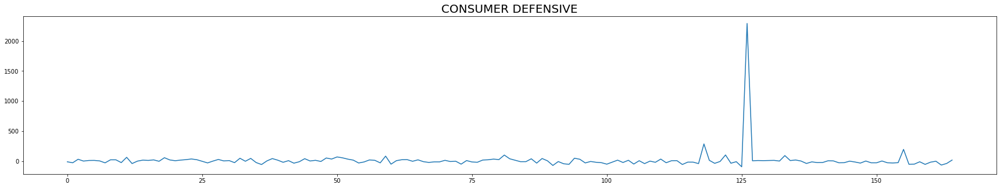

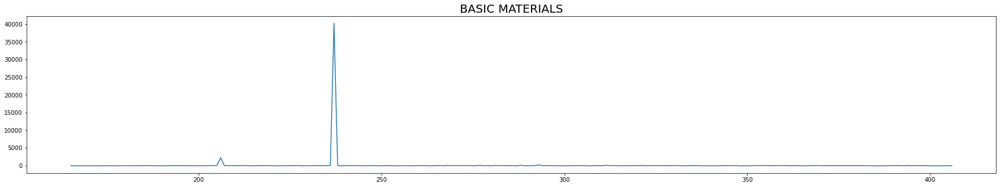

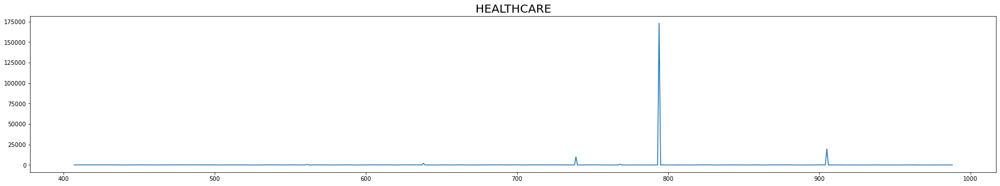

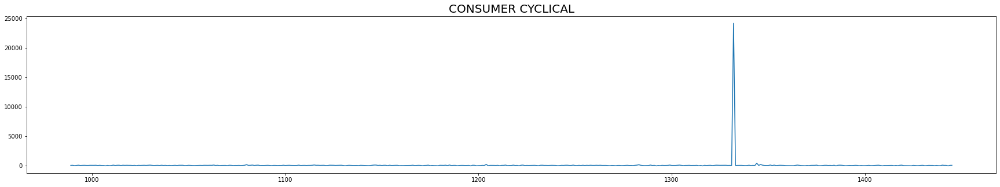

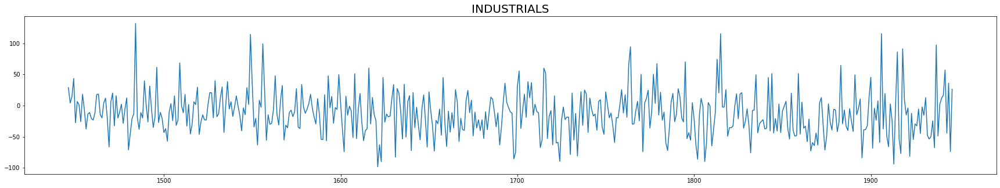

...

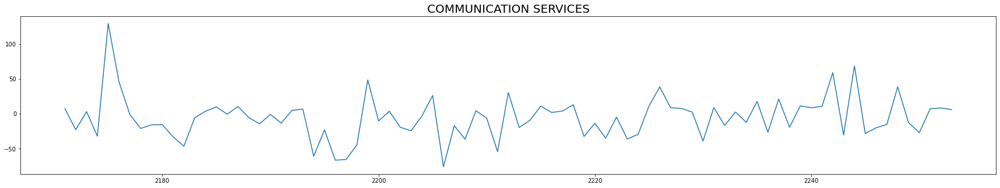

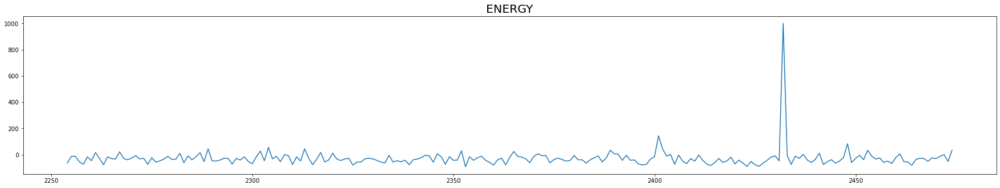

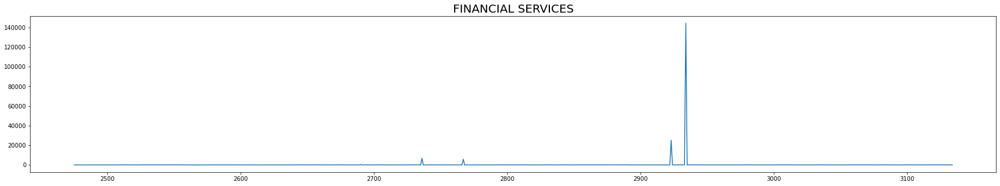

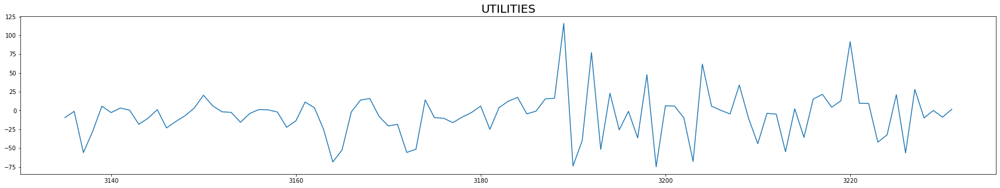

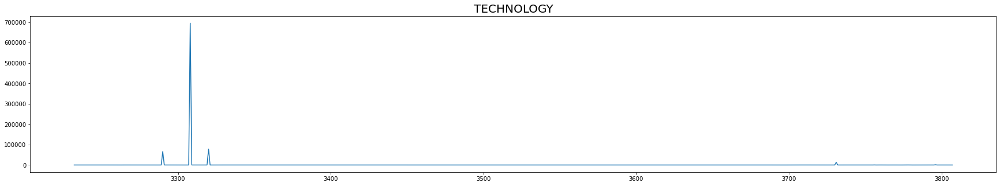

In [103]:
# Extract the columns we need in this step from the dataframe
df2014_ = data2014.loc[:, ['Sector', '2015 PRICE VAR [%]']]

# Get list of sectors
sector_list = df2014_['Sector'].unique()

# Plot the percent price variation for each sector
for sector in sector_list:
    
    temp = df2014_[df2014_['Sector'] == sector]

    plt.figure(figsize=(30,5))
    plt.plot(temp['2015 PRICE VAR [%]'])
    plt.title(sector.upper(), fontsize=20)
    plt.show()

Thanks to this check, we can clearly see that there are indeed some major peaks in the following sectors:

Consumer Defensive
Basic Materials
Healthcare
Consumer Cyclical
Real Estate
Energy
Financial Services
Technology
This means that, for one reason or another, some stocks experienced incredible gains. However, how can be sure that each of these gains is organic (i.e. due to trading activity)?

We can take a closer look at this situation by plotting the price trend for those stocks that increased their value by more than 500% during 2015. While it is possible for a stock to experience such gains, I'd still like to verify it with my eyes.

Here, we will use pandas_datareader to pull the Adjusted Close daily price, during 2015, of the required stocks. To further investigate these stocks, I think it is worth to plot the Volume too.

In [104]:
indices = list(df2014_[df2014_['2015 PRICE VAR [%]'] >= 500].index)

In [105]:
excess_ret_tickers = list(data2014.loc[indices, :].iloc[:, 0])

['LBCC',
 'CC',
 'SUM',
 'AVXL',
 'GBT',
 'PEN',
 'NYMX',
 'NK',
 'OPNT',
 'JAX',
 'GNL',
 'YRIV',
 'BSM',
 'PJT',
 'FSB',
 'JP',
 'PUB',
 'BKI',
 'BW',
 'RUN',
 'AMRH',
 'SSNT']

22 STOCKS with more than 500% gain.

[2068, 3308, 794, 2934, 3320, 3290, 237, 2923, 1332, 905, 3731, 739, 2736, 2767, 2170, 126, 206, 638, 3796, 2432, 768, 561]
['CC', 'SUM', 'AVXL', 'GBT', 'PEN', 'NYMX', 'OPNT', 'GNL', 'YRIV', 'BSM', 'PJT', 'JP', 'BKI', 'BW', 'RUN', 'SSNT']


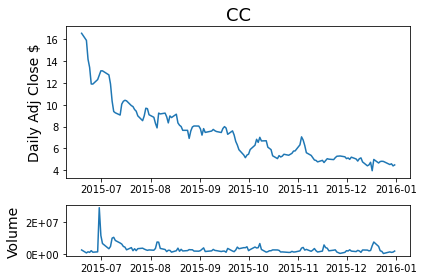

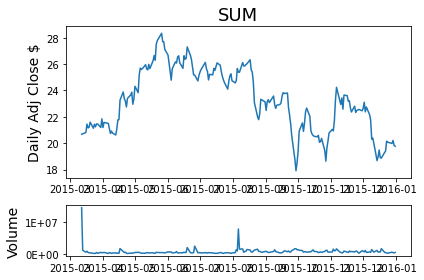

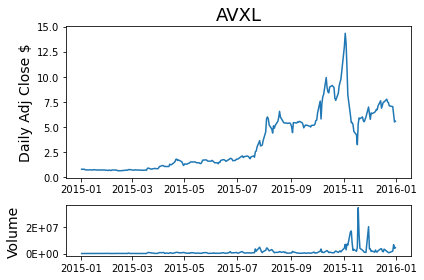

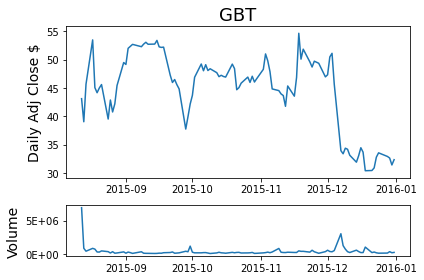

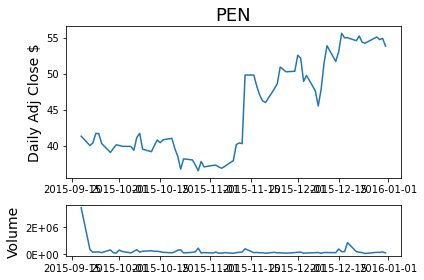

...

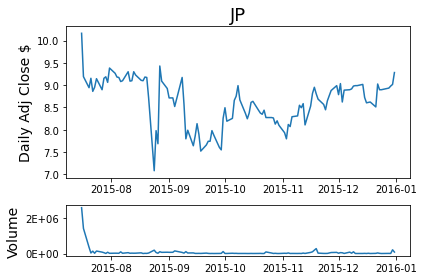

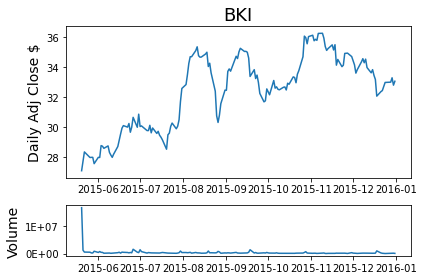

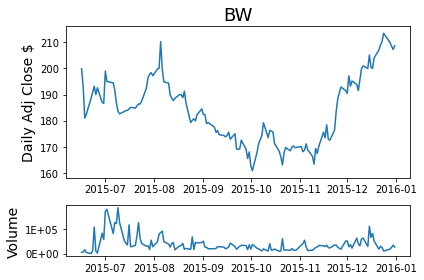

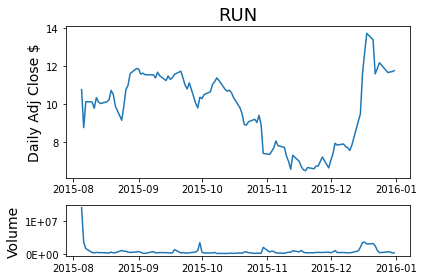

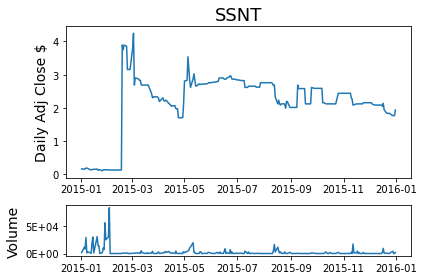

In [107]:
# Get stocks that increased more than 500%

gain = 500
top_gainers = df2014_[df2014_['2015 PRICE VAR [%]'] >= gain]
#print(top_gainers.iloc[:,1])
top_gainers = top_gainers['2015 PRICE VAR [%]'].sort_values(ascending=False) 
print(f'{len(top_gainers)} STOCKS with more than {gain}% gain.')
print()

# Set
date_start = '01-01-2015'
date_end = '12-31-2015'
tickers = top_gainers.index.values.tolist()
print(tickers)

excess_ret_tickers.remove('LBCC')
excess_ret_tickers.remove('NK')
excess_ret_tickers.remove('JAX')
excess_ret_tickers.remove('FSB')
excess_ret_tickers.remove('PUB')
excess_ret_tickers.remove('AMRH')



print(excess_ret_tickers)
for ticker in excess_ret_tickers:
    
    # Pull daily prices for each ticker from Yahoo Finance
    #try:
    daily_price = data.DataReader(ticker, 'yahoo', date_start, date_end)
    #except:pass
    
    # Plot prices with volume
    fig, (ax0, ax1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]})
    
    ax0.plot(daily_price['Adj Close'])
    ax0.set_title(ticker, fontsize=18)
    ax0.set_ylabel('Daily Adj Close $', fontsize=14)
    ax1.plot(daily_price['Volume'])
    ax1.set_ylabel('Volume', fontsize=14)
    ax1.yaxis.set_major_formatter(
            matplotlib.ticker.StrMethodFormatter('{x:.0E}'))

    fig.align_ylabels(ax1)
    fig.tight_layout()
    plt.show()

As we can see, most of the top_gainers stocks did not experienced an organic growth during 2015. This is highlighted by a portion of the price trend being completely flat, due to the absence of trading activity.

So, I reckon that only 2 stocks from the top_gainers, namely NYMX and AVXL, should be kept in the dataframe and we should drop the others.

In [108]:
inorganic_stocks = tickers[:-2] # all except last 2
data2014.drop(inorganic_stocks, axis=0, inplace=True)

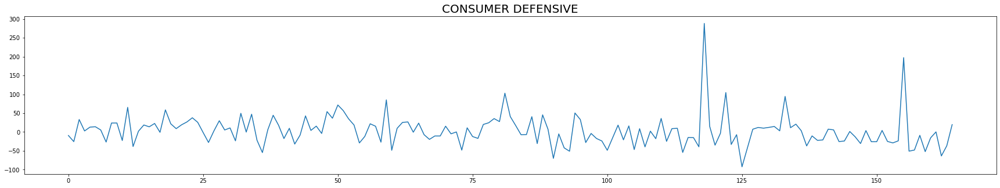

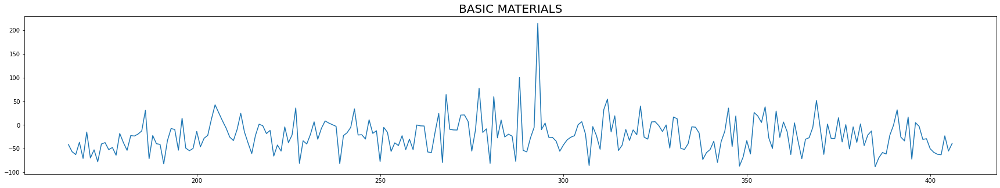

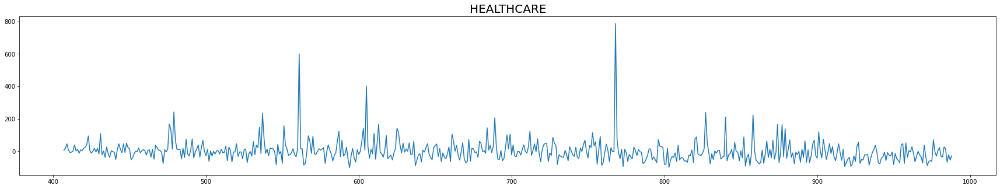

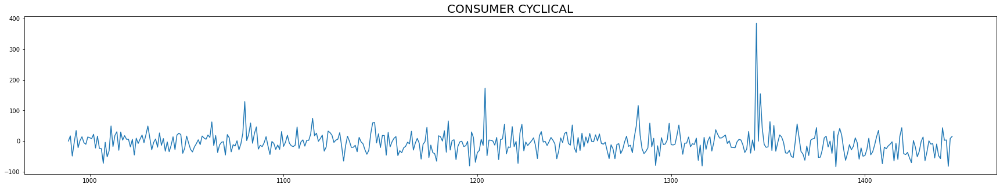

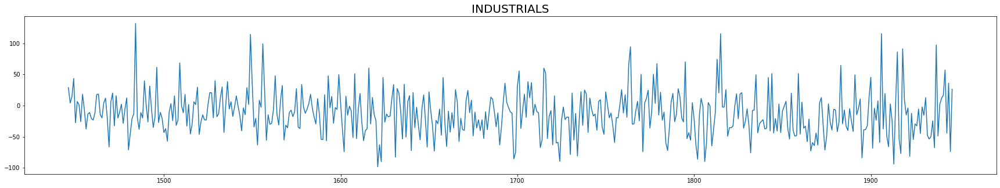

...

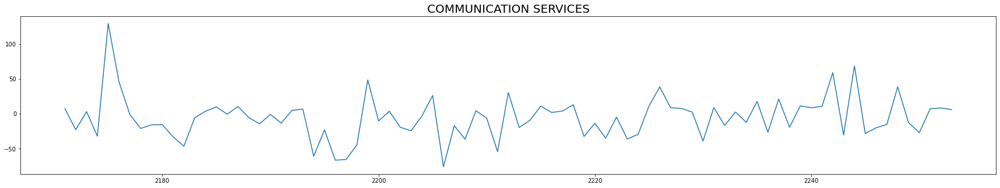

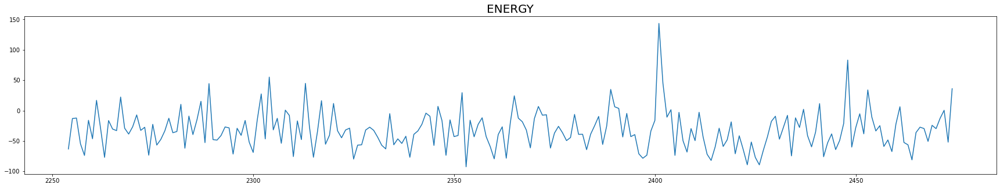

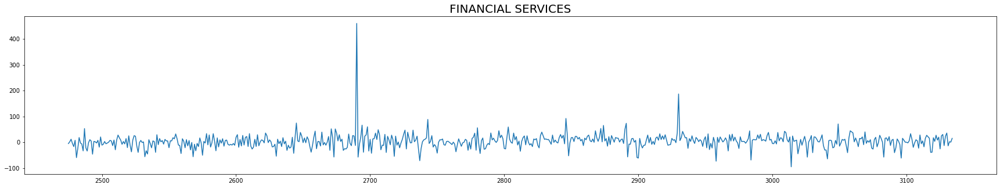

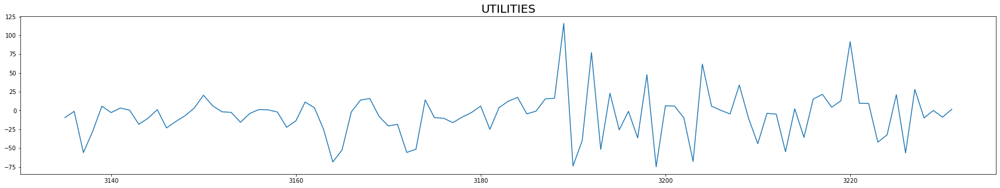

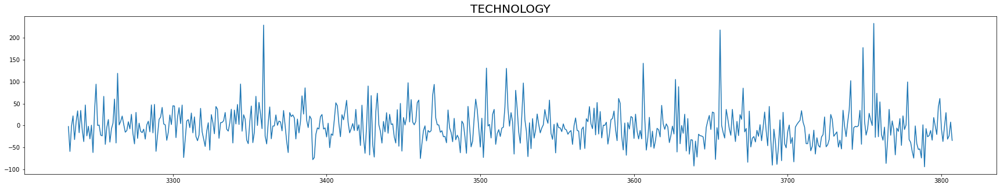

In [109]:
df2014_ = data2014.loc[:, ['Sector', '2015 PRICE VAR [%]']]
sector_list = df2014_['Sector'].unique()

for sector in sector_list:
    
    temp = df2014_[df2014_['Sector'] == sector] # get all data for one sector

    plt.figure(figsize=(30,5))
    plt.plot(temp['2015 PRICE VAR [%]'])
    plt.title(sector.upper(), fontsize=20)
    plt.show()

Now that's much better! We don't have any major peak, and the remaining ones are somewhat reasonable values.

Still, even if we removed all those fake top gainers, we cannot be fully certain that the remaining stocks have undergone an organic trading process during 2015.

### Eliminate missing values

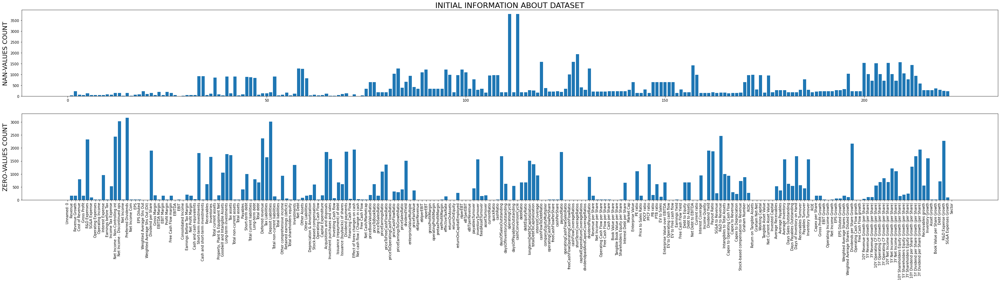

In [110]:
class_data = data2014.loc[:, ['Class', '2015 PRICE VAR [%]']]
data2014.drop(['Class', '2015 PRICE VAR [%]'], inplace=True, axis=1)

# Plot initial status of data quality in terms of nan-values and zero-values
nan_vals = data2014.isna().sum()
zero_vals = data2014.isin([0]).sum()
ind = np.arange(data2014.shape[1])

plt.figure(figsize=(50,10))

plt.subplot(2,1,1)
plt.title('INITIAL INFORMATION ABOUT DATASET', fontsize=22)
plt.bar(ind, nan_vals.values.tolist())
plt.ylabel('NAN-VALUES COUNT', fontsize=18)

plt.subplot(2,1,2)
plt.bar(ind, zero_vals.values.tolist())
plt.ylabel('ZERO-VALUES COUNT', fontsize=18)
plt.xticks(ind, nan_vals.index.values, rotation='90')

plt.show()

We can see that:

1. There are quite a lot of missing values
2. There are also a lot of 0-valued entries. For some financial indicators, almost every entry is set to 0.
To understand the situation from a more quantitative perspective, it is useful to count the occurrences of both missing-values and 0-valued entries, and sort them in descending order. This allows us to establish the dominance level for both missing values and 0-valued entries.

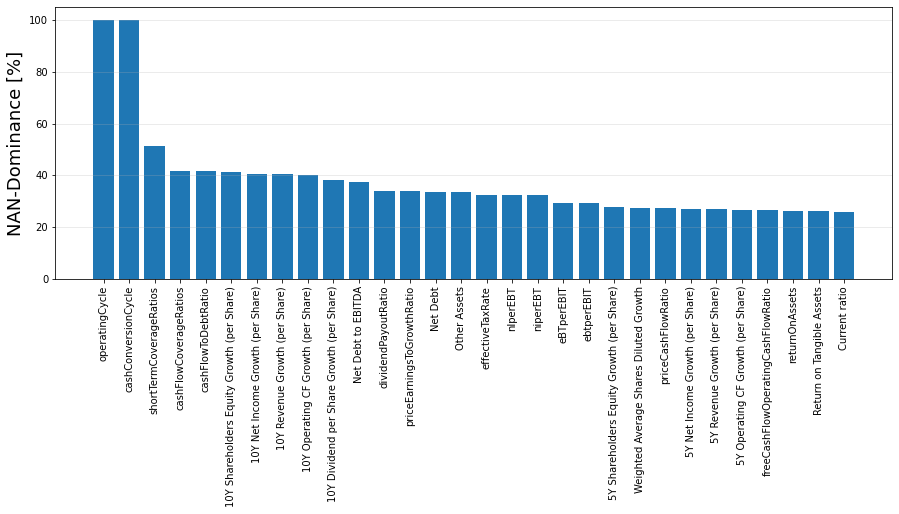

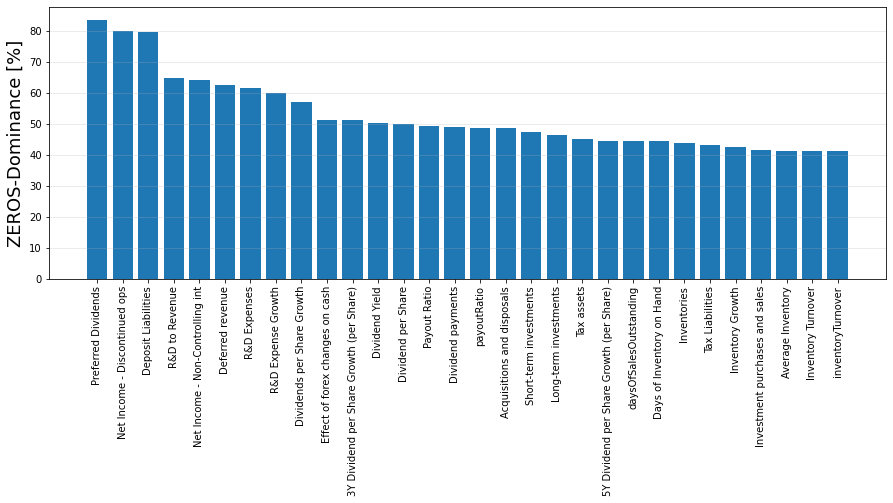

In [111]:
# Find count and percent of nan-values, zero-values
total_nans = data2014.isnull().sum().sort_values(ascending=False)
percent_nans = (data2014.isnull().sum()/data2014.isnull().count() * 100).sort_values(ascending=False)
total_zeros = data2014.isin([0]).sum().sort_values(ascending=False)
percent_zeros = (data2014.isin([0]).sum()/data2014.isin([0]).count() * 100).sort_values(ascending=False)
data2014_nans = pd.concat([total_nans, percent_nans], axis=1, keys=['Total NaN', 'Percent NaN'])
data2014_zeros = pd.concat([total_zeros, percent_zeros], axis=1, keys=['Total Zeros', 'Percent Zeros'])

# Graphical representation
plt.figure(figsize=(15,5))
plt.bar(np.arange(30), data2014_nans['Percent NaN'].iloc[:30].values.tolist())
plt.xticks(np.arange(30), data2014_nans['Percent NaN'].iloc[:30].index.values.tolist(), rotation='90')
plt.ylabel('NAN-Dominance [%]', fontsize=18)
plt.grid(alpha=0.3, axis='y')
plt.show()

plt.figure(figsize=(15,5))
plt.bar(np.arange(30), data2014_zeros['Percent Zeros'].iloc[:30].values.tolist())
plt.xticks(np.arange(30), data2014_zeros['Percent Zeros'].iloc[:30].index.values.tolist(), rotation='90')
plt.ylabel('ZEROS-Dominance [%]', fontsize=18)
plt.grid(alpha=0.3, axis='y')
plt.show()

The two plots above clearly show that to improve the quality of the dataframe df we need to:

fill the missing data
fill or drop those indicators that are heavy zeros-dominant.
What levels of nan-dominance and zeros-dominance are we going to tolerate?

I usually determine a threshold level for both nan-dominance and zeros-dominance, which corresponds to a given percentage of the total available samples (rows): if a column has a percentage of nan-values and/or zero-valued entries higher than the threshold, I drop it.

For this specific case we know that we have about 3800 samples, so I reckon we can set:

nan-dominance threshold = 5-7%
zeros-dominance threshold = 5-10%
Once the threshold levels have been set, I iteratively compute the .quantile() of both df_nans and df_zeros in order to find the number of financial indicators that I will be dropping. In this case, we can see that:

We need to drop the top 50% (test_nan_level=1-0.5=0.5) nan-dominant financial indicators in order to not have columns with more than 226 nan values, which corresponds to a nan-dominance threshold of 5.9% (aligned with our initial guess).
We need to drop the top 40% (test_zeros_level=1-0.4=0.6) zero-dominant financial indicators in order to not have columns with more than 283 0 values, which corresponds to a zero-dominance threshold of 7.5% (aligned with our initial guess).

In [112]:
# Find reasonable threshold for nan-values situation
test_nan_level = 0.5
print(data2014_nans.quantile(test_nan_level))
_, thresh_nan = data2014_nans.quantile(test_nan_level)

# Find reasonable threshold for zero-values situation
test_zeros_level = 0.6
print(data2014_zeros.quantile(test_zeros_level))
_, thresh_zeros = data2014_zeros.quantile(test_zeros_level)

Total NaN      226.000000
Percent NaN      5.966209
Name: 0.5, dtype: float64
Total Zeros      277.000000
Percent Zeros      7.312566
Name: 0.6, dtype: float64


In [113]:
# Clean dataset applying thresholds for both zero values, nan-values
print(f'INITIAL NUMBER OF VARIABLES: {data2014.shape[1]}')
print()

data2014_test1 = data2014.drop((data2014_nans[data2014_nans['Percent NaN'] > thresh_nan]).index, 1)
print(f'NUMBER OF VARIABLES AFTER NaN THRESHOLD {thresh_nan:.2f}%: {data2014_test1.shape[1]}')
print()

data2014_zeros_postnan = data2014_zeros.drop((data2014_nans[data2014_nans['Percent NaN'] > thresh_nan]).index, axis=0)
data2014_test2 = data2014_test1.drop((data2014_zeros_postnan[data2014_zeros_postnan['Percent Zeros'] > thresh_zeros]).index, 1)
print(f'NUMBER OF VARIABLES AFTER Zeros THRESHOLD {thresh_zeros:.2f}%: {data2014_test2.shape[1]}')

INITIAL NUMBER OF VARIABLES: 223

NUMBER OF VARIABLES AFTER NaN THRESHOLD 5.97%: 114

NUMBER OF VARIABLES AFTER Zeros THRESHOLD 7.31%: 63


C:\Users\carlo\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """
C:\Users\carlo\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  # Remove the CWD from sys.path while we load stuff.


### Now we try again the correlation matrix with many less variables

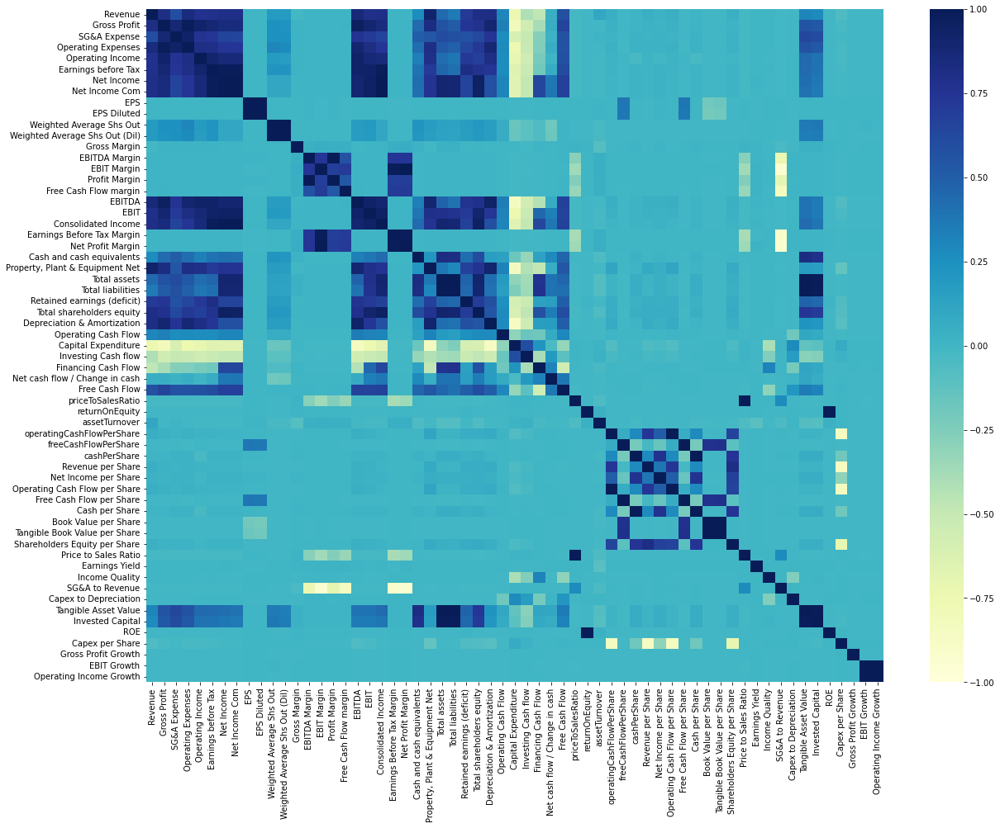

In [28]:
# Plot correlation matrix
fig, ax = plt.subplots(figsize=(20,15)) 
sns.heatmap(data2014_test2.corr(), annot=False, cmap='YlGnBu', vmin=-1, vmax=1, center=0, ax=ax)
plt.show()

## HANDLE EXTREME VALUES

In [114]:
data2014_test2.describe()

,Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Earnings before Tax,Net Income,Net Income Com,EPS,EPS Diluted,...,Income Quality,SG&A to Revenue,Capex to Depreciation,Tangible Asset Value,Invested Capital,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth
count,3.744000e+03,3.736000e+03,3.729000e+03,3.725000e+03,3.733000e+03,3.708000e+03,3.765000e+03,3.773000e+03,3.718000e+03,3.706000e+03,...,3633.000000,3632.000000,3631.000000,3.616000e+03,3.605000e+03,3.597000e+03,3.576000e+03,3562.000000,3562.000000,3562.000000
mean,5.907258e+09,2.198856e+09,9.351015e+08,1.444955e+09,6.782507e+08,5.755311e+08,4.919235e+08,4.863643e+08,-2.619988e+04,-2.666363e+04,...,2.436774,2.010552,-0.434208,1.765034e+10,1.943243e+10,1.951294e+03,-1.522512e+04,95.737643,3.650122,3.872690
std,3.911946e+10,1.162032e+10,4.833454e+09,7.324145e+09,3.796121e+09,2.800962e+09,4.408218e+09,4.403774e+09,1.676680e+06,1.677733e+06,...,55.154671,34.218508,660.081293,1.217026e+11,1.380249e+11,1.170282e+05,3.863478e+05,5642.676812,228.490653,227.593745
min,-6.276160e+08,-1.105000e+09,0.000000e+00,-1.088448e+09,-6.786000e+09,-8.878000e+09,-8.360000e+09,-8.360000e+09,-1.018709e+08,-1.018709e+08,...,-724.812500,-1.293500,-16522.069800,-2.101300e+09,-1.240000e+09,-7.101360e+01,-1.402752e+07,-48.793100,-1119.284200,-487.340900
25%,5.851275e+07,3.125250e+07,1.557000e+07,3.132300e+07,-1.211000e+06,-3.657236e+06,-3.654314e+06,-4.357820e+06,-2.300000e-01,-2.318000e-01,...,0.482600,0.092750,-1.667650,1.641032e+08,8.502888e+07,-2.060000e-02,-1.805825e+00,-0.010275,-0.268975,-0.253725
50%,4.409500e+08,1.915940e+08,7.459900e+07,1.389520e+08,4.232300e+07,2.871000e+07,2.276500e+07,2.175600e+07,7.800000e-01,7.658500e-01,...,1.257400,0.222650,-0.918300,8.515255e+08,7.897350e+08,7.800000e-02,-4.848500e-01,0.072200,0.065950,0.061200
75%,2.402177e+09,9.014335e+08,3.519930e+08,5.914230e+08,2.744000e+08,2.208995e+08,1.672160e+08,1.639940e+08,2.030000e+00,2.000000e+00,...,2.105900,0.459875,-0.448800,3.905753e+09,4.200100e+09,1.531000e-01,-9.762500e-02,0.225175,0.404500,0.353200
max,1.824698e+12,4.621600e+11,1.856830e+11,3.056050e+11,1.565540e+11,8.720500e+10,2.339970e+11,2.339970e+11,8.028004e+06,6.624003e+06,...,2086.250000,1540.600000,35298.333300,2.515999e+12,3.052798e+12,7.018763e+06,1.255873e+06,336767.800000,13562.153200,13545.338700


In [115]:
# Cut outliers
top_quantiles = data2014_test2.quantile(0.97)
outliers_top = (data2014_test2 > top_quantiles)

low_quantiles = data2014_test2.quantile(0.03)
outliers_low = (data2014_test2 < low_quantiles)

data2014_test2 = data2014_test2.mask(outliers_top, top_quantiles, axis=1)
data2014_test2 = data2014_test2.mask(outliers_low, low_quantiles, axis=1)

# Take a look at the dataframe post-outliers cut
data2014_test2.describe()

C:\Users\carlo\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\carlo\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  


,Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Earnings before Tax,Net Income,Net Income Com,EPS,EPS Diluted,...,Income Quality,SG&A to Revenue,Capex to Depreciation,Tangible Asset Value,Invested Capital,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth
count,3.744000e+03,3.736000e+03,3.729000e+03,3.725000e+03,3.733000e+03,3.708000e+03,3.765000e+03,3.773000e+03,3718.000000,3706.000000,...,3633.000000,3632.000000,3631.000000,3.616000e+03,3.605000e+03,3597.000000,3576.000000,3562.000000,3562.000000,3562.000000
mean,3.650484e+09,1.385894e+09,5.740564e+08,9.157291e+08,4.306523e+08,3.730722e+08,2.765933e+08,2.723251e+08,0.322835,0.279510,...,1.288397,0.403150,-1.465255,6.782008e+09,7.158902e+09,0.009720,-2.684067,0.187734,0.082145,0.040824
std,8.339156e+09,3.209243e+09,1.365563e+09,2.146503e+09,1.016796e+09,9.118416e+08,6.888241e+08,6.817184e+08,4.298544,4.312201,...,2.738418,0.638914,1.822008,1.663266e+10,1.749584e+10,0.365618,6.271008,0.505787,1.327980,1.208158
min,0.000000e+00,0.000000e+00,8.214736e+05,3.914738e+06,-9.783660e+07,-1.361729e+08,-1.420718e+08,-1.472978e+08,-17.596000,-17.740000,...,-6.915212,0.000000,-8.701190,9.878711e+06,-1.963800e+06,-1.278180,-31.925550,-0.579278,-3.684956,-3.754263
25%,5.851275e+07,3.125250e+07,1.557000e+07,3.132300e+07,-1.211000e+06,-3.657236e+06,-3.654314e+06,-4.357820e+06,-0.230000,-0.231800,...,0.482600,0.092750,-1.667650,1.641032e+08,8.502888e+07,-0.020600,-1.805825,-0.010275,-0.268975,-0.253725
50%,4.409500e+08,1.915940e+08,7.459900e+07,1.389520e+08,4.232300e+07,2.871000e+07,2.276500e+07,2.175600e+07,0.780000,0.765850,...,1.257400,0.222650,-0.918300,8.515255e+08,7.897350e+08,0.078000,-0.484850,0.072200,0.065950,0.061200
75%,2.402177e+09,9.014335e+08,3.519930e+08,5.914230e+08,2.744000e+08,2.208995e+08,1.672160e+08,1.639940e+08,2.030000,2.000000,...,2.105900,0.459875,-0.448800,3.905753e+09,4.200100e+09,0.153100,-0.097625,0.225175,0.404500,0.353200
max,3.991236e+10,1.537495e+10,6.623942e+09,1.052921e+10,4.701240e+09,4.176913e+09,3.165899e+09,3.126310e+09,7.464900,7.317000,...,9.176300,3.407325,0.000000,8.235325e+10,8.568560e+10,0.760068,0.000000,2.245708,4.226564,3.563666


## FILL MISSING VALUES

In this case, I think it is appropriate to fill the missing values with the mean value of the column. However, we must not forget the intrinsic characteristics of the data we are working with: we have a many stocks from many different sectors. It is fair to expect that each sector is characterized by macro-trends and macro-factors that may influence some financial indicators in different ways. So, I reckon that we should keep this separation somehow.

From a practical perspective, this translates into filling the missing value with the mean value of the column, grouped by each sector.

In [116]:
# Replace nan-values with mean value of column, considering each sector individually.
data2014_test2 = data2014_test2.groupby(['Sector']).transform(lambda x: x.fillna(x.mean()))

C:\Users\carlo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Dropping invalid columns in DataFrameGroupBy.transform is deprecated. In a future version, a TypeError will be raised. Before calling .transform, select only columns which should be valid for the transforming function.
  


As you recall, we dropped the target data from the dataframe. However, we need it back in order to use this dataset with ML algorithms. This can be easily achieved thanks to a couple .join() lines.

Finally, we can wrap this notebook up by printing both .info() and .describe() of the final dataframe df_out.

In [117]:
# Add the sector column
data2014_out = data2014_test2.join(data2014['Sector'])

# Add back the classification columns
data2014_out = data2014_out.join(class_data)

# Print information about dataset
data2014_out.info()
data2014_out.describe()
data2014_out.head(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3788 entries, 0 to 3807
Data columns (total 64 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Revenue                          3788 non-null   float64
 1   Gross Profit                     3788 non-null   float64
 2   SG&A Expense                     3788 non-null   float64
 3   Operating Expenses               3788 non-null   float64
 4   Operating Income                 3788 non-null   float64
 5   Earnings before Tax              3788 non-null   float64
 6   Net Income                       3788 non-null   float64
 7   Net Income Com                   3788 non-null   float64
 8   EPS                              3788 non-null   float64
 9   EPS Diluted                      3788 non-null   float64
 10  Weighted Average Shs Out         3788 non-null   float64
 11  Weighted Average Shs Out (Dil)   3788 non-null   float64
 12  Gross Margin        

,Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Earnings before Tax,Net Income,Net Income Com,EPS,EPS Diluted,...,Tangible Asset Value,Invested Capital,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Sector,Class,2015 PRICE VAR [%]
0,3.991236e+10,1.537495e+10,6.623942e+09,1.052921e+10,4.701240e+09,4.176913e+09,3.165899e+09,3.126310e+09,4.1900,4.010,...,5.971900e+10,5.285200e+10,0.166400,-1.4220,-0.1185,-0.0001,0.0067,Consumer Defensive,0,-9.323276
1,3.734148e+09,9.285226e+08,3.441414e+08,7.939267e+08,1.345959e+08,1.753823e+08,1.358227e+08,1.358227e+08,0.2396,0.226,...,2.546029e+09,7.553510e+08,0.329400,-17.8582,1.2489,1.6142,1.9463,Consumer Defensive,0,-25.512193
2,3.991236e+10,1.537495e+10,6.623942e+09,1.052921e+10,2.725000e+09,2.270000e+09,1.519000e+09,1.519000e+09,1.4700,1.450,...,2.644400e+10,2.664800e+10,0.282100,-2.2665,0.0173,-0.0145,-0.0141,Consumer Defensive,1,33.118297
3,2.552641e+10,7.323734e+09,6.561162e+09,6.586482e+09,7.372520e+08,2.502180e+08,2.494140e+08,2.154160e+08,4.6000,4.600,...,6.513644e+09,9.616929e+09,-0.118000,-6.9087,0.0007,0.2904,0.1113,Consumer Defensive,1,2.752291
4,1.790960e+10,6.369800e+09,3.474300e+09,3.412400e+09,2.957400e+09,2.707700e+09,1.824400e+09,1.824400e+09,2.9000,2.830,...,9.480900e+09,1.197590e+10,0.279200,-1.0690,-0.0084,0.0332,0.0370,Consumer Defensive,1,12.897715
5,3.991236e+10,1.537495e+10,6.623942e+09,7.629000e+09,4.701240e+09,4.176913e+09,3.165899e+09,3.126310e+09,4.7600,4.760,...,2.381400e+10,3.647500e+10,-0.593300,-0.7421,-0.0709,-0.1193,-0.1341,Consumer Defensive,1,13.980937
6,3.991236e+10,1.537495e+10,6.623942e+09,1.052921e+10,4.701240e+09,4.176913e+09,3.165899e+09,3.126310e+09,1.6200,1.600,...,6.565100e+10,5.701200e+10,0.234100,-0.4976,-0.0114,-0.1778,-0.0508,Consumer Defensive,1,5.339413
7,3.991236e+10,1.537495e+10,6.623942e+09,1.052921e+10,4.701240e+09,4.176913e+09,3.165899e+09,3.126310e+09,4.9000,4.880,...,8.235325e+10,8.568560e+10,0.210100,-3.7895,0.0161,-0.0273,-0.0308,Consumer Defensive,0,-26.653702
8,3.424400e+10,1.259700e+10,6.623942e+09,9.355000e+09,3.242000e+09,2.537000e+09,2.184000e+09,2.184000e+09,1.2900,1.280,...,2.304700e+10,2.406500e+10,0.078700,-0.9733,-0.0391,-0.4193,-0.1774,Consumer Defensive,1,23.809818
9,2.452200e+10,1.016000e+10,2.539000e+09,2.540000e+09,4.701240e+09,4.176913e+09,3.165899e+09,3.126310e+09,2.5600,2.560,...,1.714100e+10,2.084000e+10,0.760068,-0.0825,-0.0284,0.0740,-0.0574,Consumer Defensive,1,23.865489
